In [1]:
# For Development and debugging:
# Reload modul without restarting the kernel
%load_ext autoreload
%autoreload 2

In [8]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import sys
import matplotlib.pyplot as plt
import json

# Add EXTERNAL_LIBS_PATH to sys paths (for loading libraries)
EXTERNAL_LIBS_PATH = '/home/hhughes/Documents/Master_Thesis/Project/workspace/libs'
sys.path.insert(1, EXTERNAL_LIBS_PATH)

# Load cortum libs
import NN_interpretability as nn_inter
import Data_augmentation as data_aug

# Disable GPU
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

# 1.- Load pretrained Model and predicted values

In [3]:
test_model_path = '/home/hhughes/Documents/Master_Thesis/Project/workspace/Interpretability/Models/BL_test1/'
model = tf.keras.models.load_model(os.path.join(test_model_path, 'CMA_0'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 64)      19072     
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 64)      256       
_________________________________________________________________
re_lu (ReLU)                 (None, 224, 224, 64)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 128)     73856     
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 128)     512       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 112, 112, 128)     0

In [4]:
# Load model_predictions
with open(os.path.join(test_model_path, 'targets_CMA_0.csv'), 'r') as file:
    targets_df = pd.read_csv(file)
    mask = targets_df.set == 'test'
    targets_df = targets_df[~mask]
# Sort by abs difference between y and y_hat
targets_df.loc[targets_df['y - y_hat'].abs().argsort()]

,y,y_hat,mapobject_id_cell,set,y - y_hat,perturbation,cell_cycle
2549,405.562714,405.558167,258533,train,0.004547,normal,S
2643,324.310883,324.318146,331807,train,-0.007263,normal,G1
3117,310.374542,310.365173,295709,val,0.009369,DMSO,G1
1890,336.368744,336.319794,278713,train,0.048950,normal,G1
2810,326.268768,326.321960,291586,train,-0.053192,normal,G1
...,...,...,...,...,...,...,...
3059,644.971497,511.101013,262901,val,133.870483,normal,G2
2921,537.458374,401.915192,359417,train,135.543182,DMSO,S
2889,523.743408,384.663605,378157,train,139.079803,normal,G1
2713,207.263077,361.649200,202813,train,-154.386124,normal,G1


In [5]:
# Load parameters
with open(os.path.join(test_model_path, 'parameters.json'), 'r') as file:
    p = json.load(file)
p.keys()

dict_keys(['_comment', 'model_path', 'model_dir', 'clean_model_dir', 'external_libs_path', 'pp_path', 'local_tf_datasets', 'tf_ds_name', 'shuffle_files', 'random_horizontal_flipping', 'random_90deg_rotations', 'CenterZoom', 'CenterZoom_mode', 'disable_gpu', 'set_memory_growth', 'model_name', 'pre_training', 'conv_reg', 'dense_reg', 'verbose_level', 'number_of_epochs', 'loss', 'learning_rate', 'BATCH_SIZE', 'log_file_name', 'log_level', 'tensorboard', 'seed', 'input_channels', 'parameters_file_path'])

In [6]:
# Load channels
with open(os.path.join(test_model_path, 'channels.csv'), 'r') as file:
    channels_df = pd.read_csv(file)
# Get input channel ids
mask = channels_df.name.isin(p['input_channels'])
channel_ids = channels_df[mask].channel_id.values
# Get output channel id
mask = channels_df.name == '00_EU'
output_id = channels_df[mask].channel_id.values[0]
# Get normalization values
norm_vals = channels_df.sort_values(by=['channel_id']).normalization_vals.values

# 2.- Load Cell samples

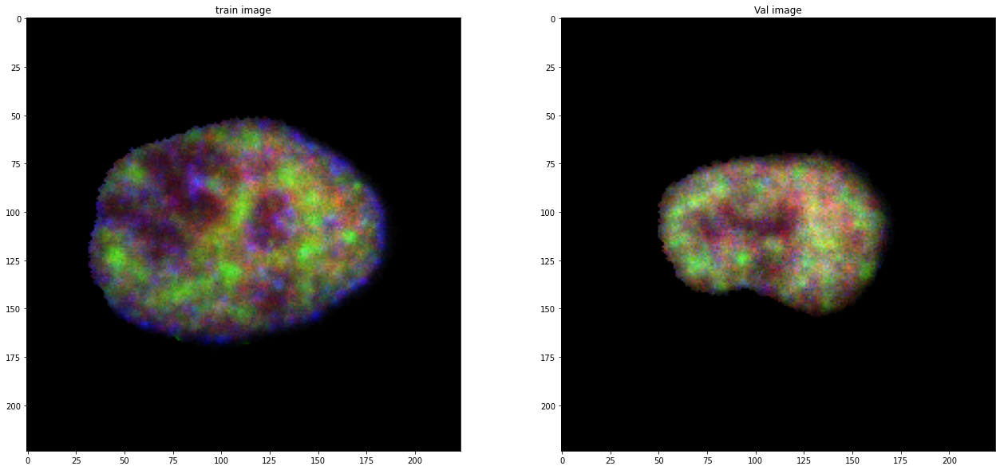

In [7]:
# select one element from train and val to get the IG
train_cell = np.load(os.path.join(test_model_path, 'Cells', '258533.npz'))
train_mask = train_cell['mask']
train_img = train_cell['img'] / norm_vals
train_img = train_img[:,:,channel_ids].astype(np.float32)
train_target = train_cell['targets']

val_cell = np.load(os.path.join(test_model_path, 'Cells', '295709.npz'))
val_mask = val_cell['mask']
val_img = val_cell['img'] / norm_vals
val_img = val_img[:,:,channel_ids].astype(np.float32)
val_target = val_cell['targets']

# Now take a look into its image

temp_img = (train_img / np.max(train_img, axis=(0,1)))[:,:,10:13]
plt.figure(figsize=(2*11,10))
plt.subplot(1,2,1)
nn_inter.plot_cell(img=temp_img, title='train image')

temp_img = (val_img / np.max(val_img, axis=(0,1)))[:,:,10:13]
plt.subplot(1,2,2)
nn_inter.plot_cell(img=temp_img, title='Val image')
plt.show()

In [8]:
# Sanity check: compute y_hat given the image
train_tensor = tf.convert_to_tensor(train_img, dtype=tf.float32)
train_tensor = tf.expand_dims(train_tensor, axis=0)
print(model.predict(train_tensor)[0][0], train_target[output_id])
mask = (targets_df.mapobject_id_cell == 258533)
targets_df[mask]

405.55716 405.5627106983144


,y,y_hat,mapobject_id_cell,set,y - y_hat,perturbation,cell_cycle
2549,405.562714,405.558167,258533,train,0.004547,normal,S


In [9]:
# Sanity check: compute y_hat given the image
val_tensor = tf.convert_to_tensor(val_img, dtype=tf.float32)
val_tensor = tf.expand_dims(val_tensor, axis=0)
print(model.predict(val_tensor)[0][0], val_target[output_id])
mask = (targets_df.mapobject_id_cell == 295709)
targets_df[mask]

310.3597 310.3745313671582


,y,y_hat,mapobject_id_cell,set,y - y_hat,perturbation,cell_cycle
3117,310.374542,310.365173,295709,val,0.009369,DMSO,G1


# 3.-Integrated gradient IG

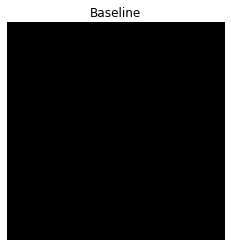

In [22]:
# Create Baseline
n_channels = train_img.shape[-1]
baseline = tf.zeros(shape=(224,224,n_channels))
plt.imshow(baseline[:,:,0:3])
plt.title("Baseline")
plt.axis('off')
plt.show()

In [23]:
# create image interpolation
m_steps=50
# Generate m_steps intervals for integral_approximation() below.
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
interpolated_images = nn_inter.interpolate_images(
    baseline=baseline,
    image=train_img,
    alphas=alphas)

In [24]:
interpolated_images.shape

TensorShape([51, 224, 224, 33])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


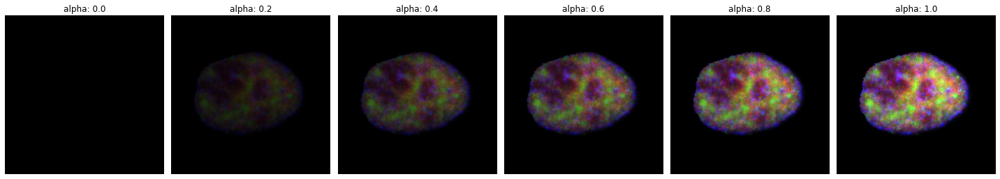

In [25]:
# Plot interpolation
fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::10], interpolated_images[0::10]):
    i += 1
    plt.subplot(1, len(alphas[0::10]), i)
    plt.title(f'alpha: {alpha:.1f}')
    plt.imshow(image[:,:,10:13])
    plt.axis('off')

plt.tight_layout();

In [26]:
path_gradients = nn_inter.compute_gradients(
    images=interpolated_images,
    model=model)

In [27]:
path_gradients.shape

TensorShape([51, 224, 224, 33])

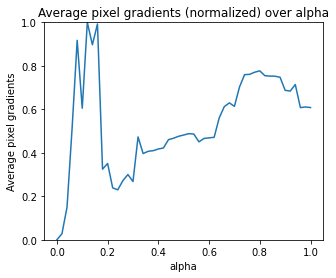

In [28]:
pred = model(interpolated_images)

plt.figure(figsize=(5, 4))

# Average across interpolation steps
average_grads = tf.reduce_mean(path_gradients, axis=[1, 2, 3])
# Normalize gradients to 0 to 1 scale. E.g. (x - min(x))/(max(x)-min(x))
average_grads_norm = (average_grads-tf.math.reduce_min(average_grads))/(tf.math.reduce_max(average_grads)-tf.reduce_min(average_grads))
plt.plot(alphas, average_grads_norm)
plt.title('Average pixel gradients (normalized) over alpha')
plt.ylabel('Average pixel gradients')
plt.xlabel('alpha')
plt.ylim([0, 1]);

In [29]:
ig = nn_inter.integral_approximation(
    gradients=path_gradients)
print(ig.shape)

(224, 224, 33)


In [34]:
ig_attributions = nn_inter.integrated_gradients(baseline=baseline,
                                                image=train_img,
                                                model=model,
                                                m_steps=240)
ig_attributions.shape

TensorShape([224, 224, 33])

# 4.- VarGrad

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


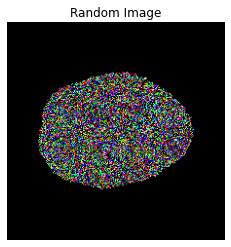

In [168]:
# VarGrad is an Ensembling method with. To create the different "models" we add noise to
# the image several times (as many times as images we need)

img_shape = train_img.shape
rnorm_img = np.random.normal(loc=0, scale=1, size=img_shape)
rnorm_img[~train_mask] = 0
plt.imshow(rnorm_img[:,:,0:3])
plt.title("Random Image")
plt.axis('off')
plt.show()

In [10]:
VarGrad_IG_train = nn_inter.get_VarGrad(img=train_img,
                                        img_mask=train_mask,
                                        baseline='black',
                                        model=model,
                                        n_images=50)
VarGrad_IG_train.shape

Computing IG  1
Computing IG  2
Computing IG  3
Computing IG  4
Computing IG  5
Computing IG  6
Computing IG  7
Computing IG  8
Computing IG  9
Computing IG  10
Computing IG  11
Computing IG  12
Computing IG  13
Computing IG  14
Computing IG  15
Computing IG  16
Computing IG  17
Computing IG  18
Computing IG  19
Computing IG  20
Computing IG  21
Computing IG  22
Computing IG  23
Computing IG  24
Computing IG  25
Computing IG  26
Computing IG  27
Computing IG  28
Computing IG  29
Computing IG  30
Computing IG  31
Computing IG  32
Computing IG  33
Computing IG  34
Computing IG  35
Computing IG  36
Computing IG  37
Computing IG  38
Computing IG  39
Computing IG  40
Computing IG  41
Computing IG  42
Computing IG  43
Computing IG  44
Computing IG  45
Computing IG  46
Computing IG  47
Computing IG  48
Computing IG  49
Computing IG  50


TensorShape([224, 224, 33])

In [29]:
cell_id = '258533'
file_path = os.path.join(test_model_path, 'Cells', 'BL_t1_VarGradIG_'+cell_id+'.npy')
np.save(file_path, VarGrad_IG_train.numpy())

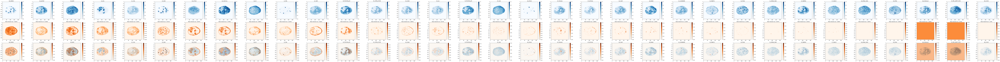

In [22]:
nn_inter.plot_VarGrad_IG(img=train_img,
                         img_mask=train_mask,
                         importance_map=VarGrad_IG_train,
                         top_percent=0.2,
                         channels_df=channels_df,
                         img_size=(7,7)
                        )

## val set image

In [12]:
VarGrad_IG_val = nn_inter.get_VarGrad(img=val_img,
                                      img_mask=val_mask,
                                      baseline='black',
                                      model=model,
                                      n_images=50)
VarGrad_IG_val.shape

Computing IG  1
Computing IG  2
Computing IG  3
Computing IG  4
Computing IG  5
Computing IG  6
Computing IG  7
Computing IG  8
Computing IG  9
Computing IG  10
Computing IG  11
Computing IG  12
Computing IG  13
Computing IG  14
Computing IG  15
Computing IG  16
Computing IG  17
Computing IG  18
Computing IG  19
Computing IG  20
Computing IG  21
Computing IG  22
Computing IG  23
Computing IG  24
Computing IG  25
Computing IG  26
Computing IG  27
Computing IG  28
Computing IG  29
Computing IG  30
Computing IG  31
Computing IG  32
Computing IG  33
Computing IG  34
Computing IG  35
Computing IG  36
Computing IG  37
Computing IG  38
Computing IG  39
Computing IG  40
Computing IG  41
Computing IG  42
Computing IG  43
Computing IG  44
Computing IG  45
Computing IG  46
Computing IG  47
Computing IG  48
Computing IG  49
Computing IG  50


TensorShape([224, 224, 33])

In [30]:
cell_id = '295709'
file_path = os.path.join(test_model_path, 'Cells', 'BL_t1_VarGradIG_'+cell_id+'.npy')
np.save(file_path, VarGrad_IG_val.numpy())

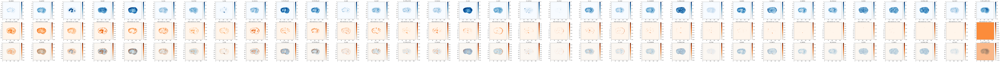

In [13]:
nn_inter.plot_VarGrad_IG(img=val_img,
                         img_mask=val_mask,
                         importance_map=VarGrad_IG_val,
                         top_percent=0.2,
                         channels_df=channels_df,
                         img_size=(7,7)
                        )

# 4.1 Plot worst cells

In [14]:
targets_df.loc[targets_df['y - y_hat'].abs().argsort()].tail()

,y,y_hat,mapobject_id_cell,set,y - y_hat,perturbation,cell_cycle
3059,644.971497,511.101013,262901,val,133.870483,normal,G2
2921,537.458374,401.915192,359417,train,135.543182,DMSO,S
2889,523.743408,384.663605,378157,train,139.079803,normal,G1
2713,207.263077,361.649200,202813,train,-154.386124,normal,G1
2331,519.404358,364.881439,275864,train,154.522919,normal,G1


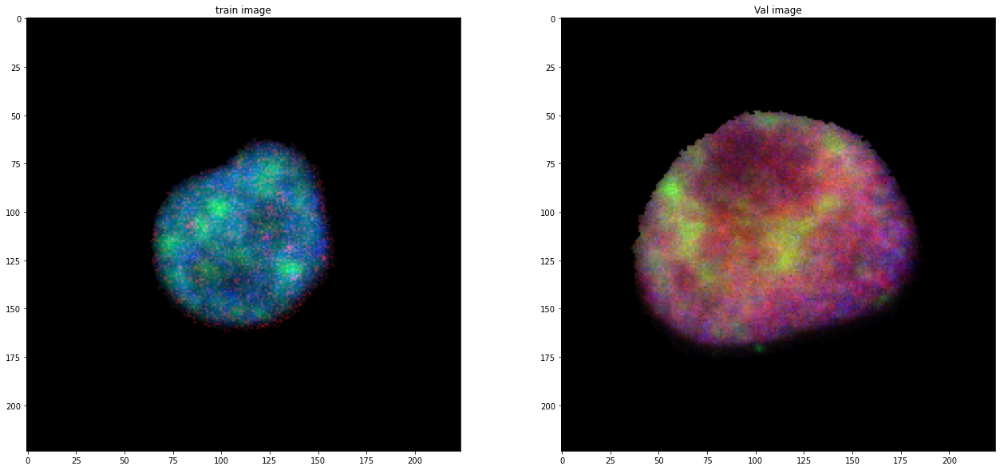

In [15]:
# select one element from train and val to get the IG
train_cell_2 = np.load(os.path.join(test_model_path, 'Cells', '275864.npz'))
train_mask_2 = train_cell_2['mask']
train_img_2 = train_cell_2['img'] / norm_vals
train_img_2 = train_img_2[:,:,channel_ids].astype(np.float32)
train_target_2 = train_cell_2['targets']

val_cell_2 = np.load(os.path.join(test_model_path, 'Cells', '262901.npz'))
val_mask_2 = val_cell_2['mask']
val_img_2 = val_cell_2['img'] / norm_vals
val_img_2 = val_img_2[:,:,channel_ids].astype(np.float32)
val_target_2 = val_cell_2['targets']

# Now take a look into its image

temp_img = (train_img_2 / np.max(train_img_2, axis=(0,1)))[:,:,10:13]
plt.figure(figsize=(2*11,10))
plt.subplot(1,2,1)
nn_inter.plot_cell(img=temp_img, title='train image')

temp_img = (val_img_2 / np.max(val_img_2, axis=(0,1)))[:,:,10:13]
plt.subplot(1,2,2)
nn_inter.plot_cell(img=temp_img, title='Val image')
plt.show()

In [16]:
# Sanity check: compute y_hat given the image
train_tensor_2 = tf.convert_to_tensor(train_img_2, dtype=tf.float32)
train_tensor_2 = tf.expand_dims(train_tensor_2, axis=0)
print(train_target_2[output_id], model.predict(train_tensor_2)[0][0])
mask = (targets_df.mapobject_id_cell == 275864)
targets_df[mask]

519.4043417366947 364.87735


,y,y_hat,mapobject_id_cell,set,y - y_hat,perturbation,cell_cycle
2331,519.404358,364.881439,275864,train,154.522919,normal,G1


In [17]:
# Sanity check: compute y_hat given the image
val_tensor_2 = tf.convert_to_tensor(val_img_2, dtype=tf.float32)
val_tensor_2 = tf.expand_dims(val_tensor_2, axis=0)
print(val_target_2[output_id], model.predict(val_tensor_2)[0][0])
mask = (targets_df.mapobject_id_cell == 262901)
targets_df[mask]

644.9714751426243 511.10046


,y,y_hat,mapobject_id_cell,set,y - y_hat,perturbation,cell_cycle
3059,644.971497,511.101013,262901,val,133.870483,normal,G2


In [18]:
VarGrad_IG_train_2 = nn_inter.get_VarGrad(img=train_img_2,
                                          img_mask=train_mask_2,
                                          baseline='black',
                                          model=model,
                                          n_images=50)
VarGrad_IG_train_2.shape

Computing IG  1
Computing IG  2
Computing IG  3
Computing IG  4
Computing IG  5
Computing IG  6
Computing IG  7
Computing IG  8
Computing IG  9
Computing IG  10
Computing IG  11
Computing IG  12
Computing IG  13
Computing IG  14
Computing IG  15
Computing IG  16
Computing IG  17
Computing IG  18
Computing IG  19
Computing IG  20
Computing IG  21
Computing IG  22
Computing IG  23
Computing IG  24
Computing IG  25
Computing IG  26
Computing IG  27
Computing IG  28
Computing IG  29
Computing IG  30
Computing IG  31
Computing IG  32
Computing IG  33
Computing IG  34
Computing IG  35
Computing IG  36
Computing IG  37
Computing IG  38
Computing IG  39
Computing IG  40
Computing IG  41
Computing IG  42
Computing IG  43
Computing IG  44
Computing IG  45
Computing IG  46
Computing IG  47
Computing IG  48
Computing IG  49
Computing IG  50


TensorShape([224, 224, 33])

In [31]:
cell_id = '275864'
file_path = os.path.join(test_model_path, 'Cells', 'BL_t1_VarGradIG_'+cell_id+'.npy')
np.save(file_path, VarGrad_IG_train_2.numpy())

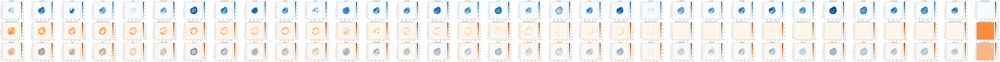

In [23]:
nn_inter.plot_VarGrad_IG(img=train_img_2,
                         img_mask=train_mask_2,
                         importance_map=VarGrad_IG_train_2,
                         top_percent=0.2,
                         channels_df=channels_df,
                         img_size=(7,7)
                        )

In [20]:
VarGrad_IG_val_2 = nn_inter.get_VarGrad(img=val_img_2,
                                        img_mask=val_mask_2,
                                        baseline='black',
                                        model=model,
                                        n_images=50)
VarGrad_IG_val_2.shape

Computing IG  1
Computing IG  2
Computing IG  3
Computing IG  4
Computing IG  5
Computing IG  6
Computing IG  7
Computing IG  8
Computing IG  9
Computing IG  10
Computing IG  11
Computing IG  12
Computing IG  13
Computing IG  14
Computing IG  15
Computing IG  16
Computing IG  17
Computing IG  18
Computing IG  19
Computing IG  20
Computing IG  21
Computing IG  22
Computing IG  23
Computing IG  24
Computing IG  25
Computing IG  26
Computing IG  27
Computing IG  28
Computing IG  29
Computing IG  30
Computing IG  31
Computing IG  32
Computing IG  33
Computing IG  34
Computing IG  35
Computing IG  36
Computing IG  37
Computing IG  38
Computing IG  39
Computing IG  40
Computing IG  41
Computing IG  42
Computing IG  43
Computing IG  44
Computing IG  45
Computing IG  46
Computing IG  47
Computing IG  48
Computing IG  49
Computing IG  50


TensorShape([224, 224, 33])

In [32]:
cell_id = '262901'
file_path = os.path.join(test_model_path, 'Cells', 'BL_t1_VarGradIG_'+cell_id+'.npy')
np.save(file_path, VarGrad_IG_val_2.numpy())

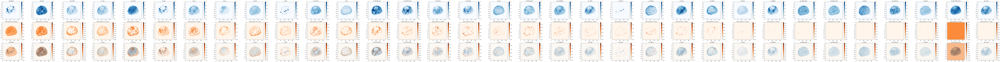

In [24]:
nn_inter.plot_VarGrad_IG(img=val_img_2,
                         img_mask=val_mask_2,
                         importance_map=VarGrad_IG_val_2,
                         top_percent=0.2,
                         channels_df=channels_df,
                         img_size=(7,7)
                        )

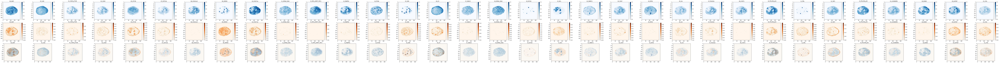

In [208]:
temp_scor = VarGrad_IG.numpy()
# remove non interesting pixels using the mask
#temp_scor[~train_mask] = 0
# Select only the top pixels
original_shape = temp_scor.shape
temp_scor = temp_scor.reshape(-1)
n_pixels = temp_scor.shape[0]

cell_prop = np.sum(train_mask)*n_channels / np.prod(train_img.shape, axis=0)

top_percent = cell_prop * 0.20
n_top_pixels = int(top_percent * n_pixels)
top_idxs = temp_scor.argsort()[-n_top_pixels:]
mask = np.zeros(n_pixels)
mask[top_idxs] = 1
mask = mask.astype(np.bool)
temp_scor[~mask] = 0
temp_scor = temp_scor.reshape(original_shape)


n_channels = train_img.shape[-1]

plt.figure(figsize=(n_channels*6.1, 2*6.1))

for c in range(n_channels):
    channel_name = channels_df['name'][channels_df.channel_id == c].values[0]
    plt.subplot(3, n_channels, c+1)
    img = plt.imshow(train_img[:,:,c],
               cmap=plt.cm.Blues,
               vmin=0, vmax=1,
               aspect='equal'
              )
    plt.title(channel_name)
    plt.colorbar(img)
    
    plt.subplot(3, n_channels, n_channels+c+1)
    img = plt.imshow(temp_scor[:,:,c],
               cmap=plt.cm.Oranges,
               #vmin=0, vmax=1,
               aspect='equal'
              )
    plt.title(channel_name)
    plt.colorbar(img)
    
    plt.subplot(3, n_channels, 2*n_channels+c+1)
    plt.imshow(temp_scor[:,:,c],
               cmap=plt.cm.Oranges,
               #vmin=0, vmax=1,
               aspect='equal',
               #alpha=0.4
              )
    plt.imshow(train_img[:,:,c],
               cmap=plt.cm.Blues,
               vmin=0, vmax=1,
               aspect='equal',
               alpha=0.4
              )

    plt.title(channel_name)

In [49]:
n_channels=train_img.shape[-1]

In [56]:
temp_score=VarGrad_IG.numpy()

score_channel_std = []
for c in range(n_channels):
    score_channel_std.append(np.sum(temp_score[:,:,c]))
    
total_var = np.sum(score_channel_std)
tempp=0
for c in range(n_channels):
    channel_std_percen = round(100*score_channel_std[c] / total_var, 3)
    print(channel_std_percen)
    tempp += channel_std_percen
tempp

4.606
2.768
3.048
2.993
3.854
2.704
1.583
7.898
3.816
2.027
1.364
2.038
2.242
3.919
3.682
1.667
1.68
2.768
4.46
2.301
2.528
1.644
2.918
2.726
1.323
3.518
3.588
3.605
2.78
2.324
2.322
5.028
4.277


99.99900000000001

In [82]:
np.argsort(-np.array(score_channel_std))

array([ 7, 31,  0, 18, 32, 13,  4,  8, 14, 27, 26, 25,  2,  3, 22, 28,  1,
       17, 23,  5, 20, 29, 30, 19, 12, 11,  9, 16, 15, 21,  6, 10, 24])

In [128]:
temp = np.array([[1,5,1],[2,1,1],[3,1,1]])
original_shape = temp.shape
temp = temp.reshape(-1)
temp

array([1, 5, 1, 2, 1, 1, 3, 1, 1])

In [129]:
top_k = 3
top_idxs = temp.argsort()[-top_k:]
top_idxs

array([3, 6, 1])

In [135]:
mask = np.zeros(temp.shape)
mask[top_idxs] = 1
mask = mask.astype(np.bool)
mask

array([False,  True, False,  True, False, False,  True, False, False])

In [136]:
temp = temp.reshape(original_shape)
mask = mask.reshape(original_shape)

In [137]:
temp[~mask] = 0
temp

array([[0, 5, 0],
       [2, 0, 0],
       [3, 0, 0]])

In [25]:
x = 11
if not x is None:
    print('sss')

sss
